In [1]:
import numpy as np
import pandas as pd
import os 
import matplotlib.pyplot as plt
# import umap
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib

from scroutines import config_plots
from scroutines import basicu
from scroutines import miscu
# from dredFISH.Utils import __init__plots
# from dredFISH.Utils import basicu
# from dredFISH.Utils import miscu

In [2]:
import sys
sys.setrecursionlimit(40000)
from scipy.cluster import hierarchy as sch

In [3]:
pth_dat = '/u/home/f/f7xiesnm/project-zipursky/easifish/sparse06/proc/r1-v8'
!ls $pth_dat

roi_all.csv  roi.csv  spotcount.csv


In [4]:
gene_names = {
    'r1_c0': "Sorcs3",
    'r1_c2': "Cdh13",
    'r1_c4': "Chrm2",
}
channel_names = pd.Series(gene_names).reset_index().set_index(0)['index']
ftrs_order = list(gene_names.keys())

genes_order = [gene_names[ftr] for ftr in ftrs_order]
genes_order

['Sorcs3', 'Cdh13', 'Chrm2']

In [5]:
f_meta = os.path.join(pth_dat, 'roi.csv')
# f_ftrs = os.path.join(pth_dat, 'spotcount_merged.csv')
f_ftrs = os.path.join(pth_dat, 'spotcount.csv')

In [6]:
f_gcamp = f'/u/home/f/f7xiesnm/project-zipursky/easifish/sparse06/outputs/r1/intensities/r1_c1_intensity.csv' 
df_gcamp = pd.read_csv(f_gcamp).rename(columns={'mean_intensity': 'gcamp'})
df_gcamp

,roi,weighted_centroid,weighted_local_centroid,gcamp
0,1,2.361220e-310,4.640336e-310,90.028198
1,2,5.562987e-307,5.562987e-307,90.157022
2,3,5.562990e-307,5.562987e-307,95.789548
3,4,5.562990e-307,6.008005e-307,88.729637
4,5,5.785498e-307,5.785501e-307,90.787868
...,...,...,...,...
36217,36218,5.562990e-307,5.340476e-307,74.216888
36218,36219,5.562983e-307,5.562987e-307,88.531509
36219,36220,5.562987e-307,5.340476e-307,90.439289
36220,36221,5.562987e-307,5.562987e-307,86.373626


In [7]:
meta = pd.read_csv(f_meta, index_col=0)
ftrs = pd.read_csv(f_ftrs, index_col=0)
df = ftrs.join(meta).dropna()
ftrs_cols = ftrs.columns.values
print(meta.shape, ftrs.shape, df.shape)

(36222, 4) (36222, 3) (36222, 7)


In [8]:
df = df.join(df_gcamp.set_index('roi')[['gcamp']])
df['gcamp_binary'] = (df['gcamp'] > 150).astype(int)
df

,r1_c0,r1_c2,r1_c4,z,y,x,area,gcamp,gcamp_binary
1,23.0,4.0,36.0,443.061619,73.841650,1072.370256,2723.038080,90.028198,0
2,65.0,42.0,46.0,473.835614,305.721293,1040.868853,4201.868160,90.157022,0
3,85.0,57.0,204.0,568.107996,109.854030,210.398051,4013.459520,95.789548,0
4,77.0,113.0,1.0,292.550746,177.277052,1040.330878,3116.207808,88.729637,0
5,21.0,21.0,31.0,470.900208,140.760811,849.866831,4031.944896,90.787868,0
...,...,...,...,...,...,...,...,...,...
36218,2.0,1.0,1.0,437.696356,693.639560,78.731035,1229.277504,74.216888,0
36219,4.0,0.0,1.0,110.557581,167.293011,796.265563,1116.943296,88.531509,0
36220,3.0,2.0,4.0,437.830721,125.267127,640.963909,720.218688,90.439289,0
36221,13.0,0.0,1.0,252.983432,293.455114,927.422992,841.084608,86.373626,0


In [9]:
# check dim
print(1920*5*0.23/2) # in um preexpansion
print(1920*4*0.23/2)

1104.0
883.2


In [10]:
max_x, max_y, max_z = df[['x', 'y', 'z']].describe().loc['max']
min_x, min_y, min_z = df[['x', 'y', 'z']].describe().loc['min']
print(f"x: {min_x:.1f}, {max_x:.1f}")
print(f"y: {min_y:.1f}, {max_y:.1f}")
print(f"z: {min_z:.1f}, {max_z:.1f}")
df['to_edge'] = np.minimum(
    np.minimum(df['x']-min_x, max_x-df['x']), 
    np.minimum(df['y']-min_y, max_y-df['y']), 
    np.minimum(df['z']-min_z, max_z-df['z']),
)

for col in ftrs_cols:
    val = df[col].values
    print(f'{col}: {np.min(val):.0f}, {np.max(val):.0f}, {np.sum(val>0)/len(df):.2f}')

x: 19.8, 1091.5
y: 12.6, 887.4
z: 2.4, 587.8
r1_c0: 0, 356, 1.00
r1_c2: 0, 219, 0.85
r1_c4: 0, 1633, 0.89


In [11]:
########### FLIP z!
df['z'] = max_z -df['z']

# check basics

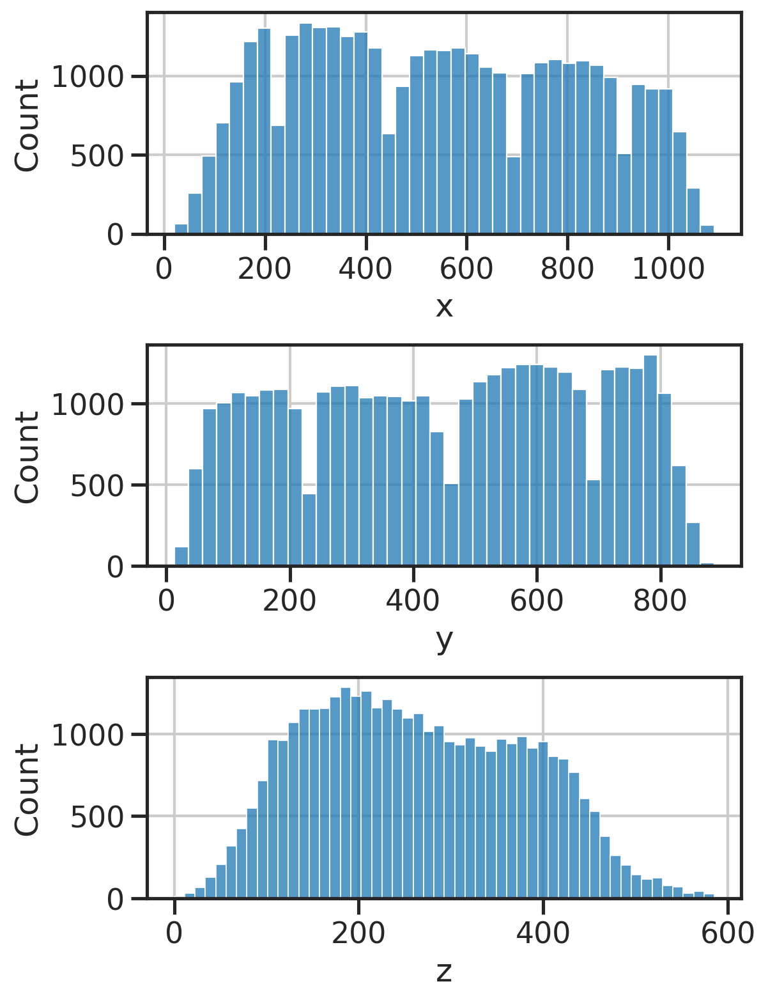

Text(0.5, 0, 'area')

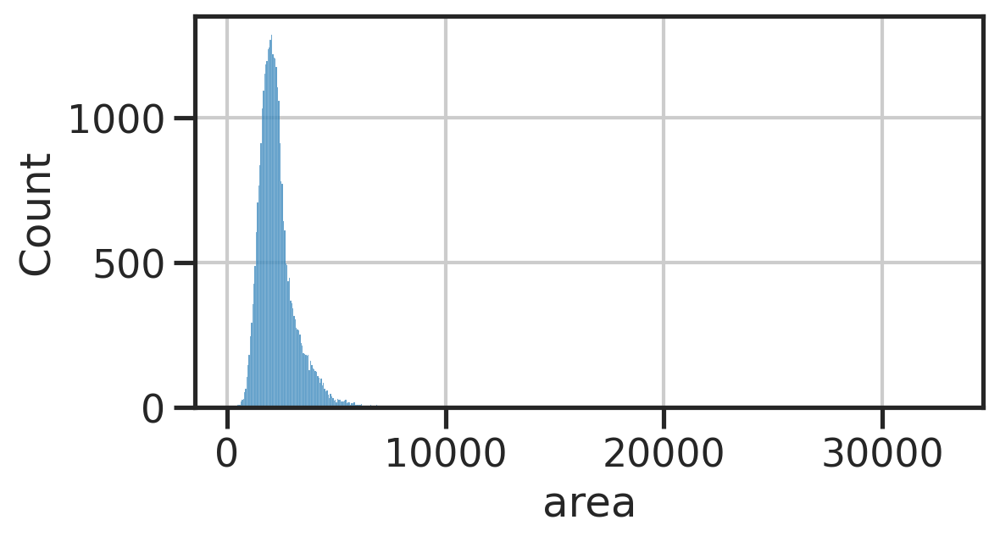

In [12]:
x = df['x'].values
y = df['y'].values
z = df['z'].values

fig, axs = plt.subplots(3, 1, figsize=(1*6, 3*3))
ax = axs[0]
sns.histplot(x, ax=ax)
ax.set_xlabel('x')

ax = axs[1]
sns.histplot(y, ax=ax)
ax.set_xlabel('y')

ax = axs[2]
sns.histplot(z, ax=ax)
ax.set_xlabel('z')

fig.subplots_adjust(hspace=0.5)
plt.show()

fig, ax = plt.subplots(1, 1, figsize=(1*6, 1*3))
sns.histplot(df['area'].values, ax=ax)
ax.set_xlabel('area')

In [13]:
# remove outliers
conds = [
    df['area'] > 500,
    df['x'] > min_x + 100,
    df['x'] < max_x - 100,
    
    df['y'] > min_y + 100,
    df['y'] < max_y - 100,
    
    df['z'] > min_z + 20,
    df['z'] < max_z - 20,
]
cond_all = np.ones(len(df)) > 0
for cond in conds:
    cond_all = np.logical_and(cond_all, cond)
    print(cond_all.sum())
print(len(df), cond_all.sum())

dfnew = df[cond_all].copy()

# size
med_size = dfnew['area'].median()
print(med_size)
size_factor = dfnew['area']/med_size

# norm by size
mat_raw = dfnew[ftrs_cols].values
dfnew[ftrs_cols] = dfnew[ftrs_cols].divide(size_factor, axis=0)
mat_sizenorm = dfnew[ftrs_cols].values

# log2+1 norm
normed_ftrs_cols = np.char.add(ftrs_cols.astype(str) ,'_log2')
dfnew[normed_ftrs_cols] = np.log2(dfnew[ftrs_cols]+1)
mat_log2norm = dfnew[normed_ftrs_cols].values

# zscore
mat_zscore = (mat_log2norm - np.mean(mat_log2norm, axis=0))/np.std(mat_log2norm, axis=0)

36209
34993
33412
30566
28547
28528
28476
36222 28476
2101.6450560000003


In [14]:
mat_ftrs = dfnew.filter(regex='_log2$') #.filter(regex='^((?!r1).)*$') #.columns
mat_ftrs.columns = [gene_names[col[:-len('_log2')]] for col in mat_ftrs.columns]
mat_ftrs = basicu.zscore(mat_ftrs, axis=0)
mat_ftrs

,Sorcs3,Cdh13,Chrm2
5,-1.130879,0.960981,0.905569
6,1.050182,2.463453,-1.118541
7,0.866990,0.187593,0.548699
10,-1.771833,0.290734,-0.115052
13,-1.358566,0.347877,-0.168009
...,...,...,...
36216,1.149165,1.189010,-1.887688
36217,0.773424,-0.482049,0.791075
36219,-1.730002,-1.496418,-0.847678
36220,-1.491010,0.407967,0.607730


In [15]:
# mat_cre = dfnew[['r1_c0_log2', 'r1_c2_log2']]
# mat_cre.columns = [gene_names[col[:-len('_log2')]] for col in mat_cre.columns]
# mat_cre

In [16]:
# # PCAs
# n_pc = len(genes_order)
# idx_pcs = np.arange(1, n_pc+1)

# pca = PCA(n_components=n_pc)
# pcs = pca.fit_transform(mat_zscore) 
# plt.plot(idx_pcs, pca.explained_variance_ratio_, 'o')
# plt.xticks(idx_pcs)
# plt.ylim(ymin=0)
# plt.axhline(1/n_pc, color='k')
# plt.xlabel('PC')
# plt.ylabel('Explained variance')

# for i in idx_pcs:
#     dfnew[f'PC{i}'] = pcs[:,i-1]

In [17]:
# # UMAPs
# Zspace = umap.UMAP(n_components=2).fit_transform(pcs)
# dfnew['umap_x'] = Zspace[:,0]
# dfnew['umap_y'] = Zspace[:,1]

# # UMAPs more
# nns = [30, 60, 120, 240, 480]
# for nn in nns:
#     Zspace = umap.UMAP(n_components=2, n_neighbors=nn).fit_transform(pcs)
#     dfnew[f'umap_x_nn{nn}'] = Zspace[:,0]
#     dfnew[f'umap_y_nn{nn}'] = Zspace[:,1]

# # clsts
# numclsts = [2, 5, 10]
# for k in numclsts: 
#     model = KMeans(n_clusters=k)
#     clsts = model.fit_predict(pcs)
#     dfnew[f'clsts_k{k}'] = np.char.add("c", clsts.astype(str))

# # clsts
# G = miscu.build_feature_graph_knnlite(pcs, k=15, metric='euclidean')
# rs = [0.01, 0.02, 0.05, 0.1, 1]
# for r in rs:
#     clsts = miscu.leiden(G, dfnew.index.values, resolution=r) 
#     dfnew[f'clsts_r{r}'] = np.char.add("c", np.array(clsts).astype(str))

Text(0.5, 0, 'Genes')

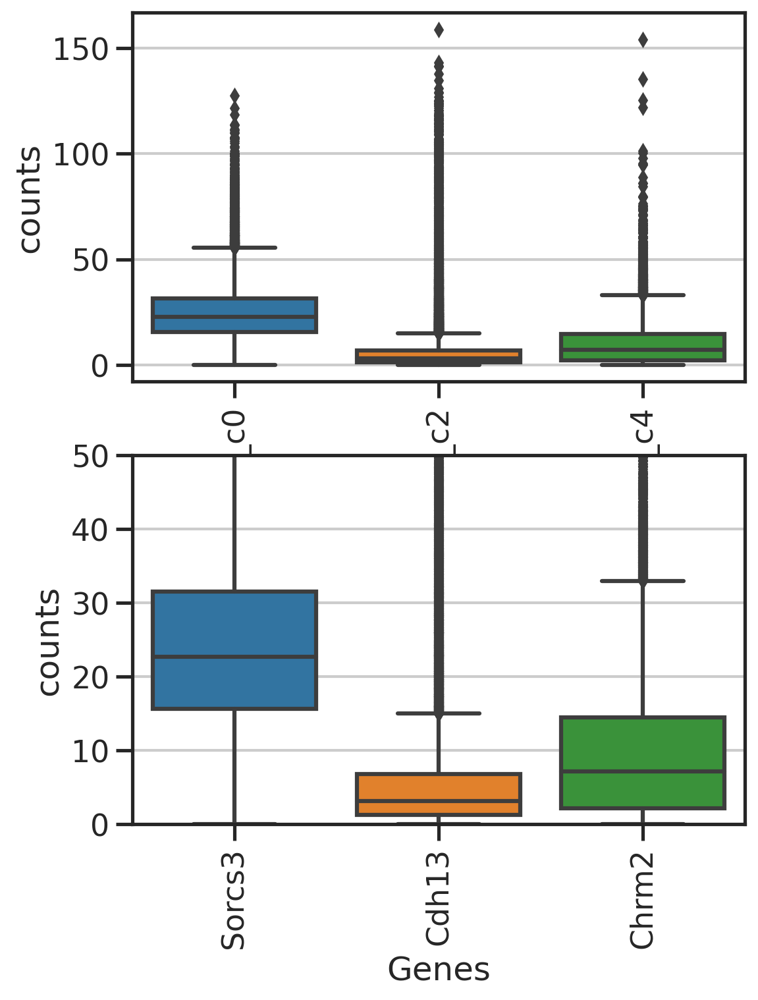

In [18]:
fig, axs = plt.subplots(2, 1, figsize=(6*1,4*2))
ax = axs[0]
sns.boxplot(data=dfnew[ftrs_cols], ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_ylabel('counts')
ax.set_xlabel('Genes')

ax = axs[1]
sns.boxplot(data=dfnew[ftrs_cols], ax=ax)
ax.set_xticklabels([gene_names[ftr_col] for ftr_col in ftrs_cols], rotation=90)
ax.set_ylim([0,50])
ax.set_ylabel('counts')
ax.set_xlabel('Genes')

In [19]:
# binary analysis
# ybins = np.linspace(0,400,100)
# dfnew['ybin'] = pd.cut(dfnew['y'], bins=ybins)

# xbins = np.linspace(0,400,100)
# dfnew['xbin'] = pd.cut(dfnew['x'], bins=xbins)

# zbins = np.linspace(0,400,100)
# dfnew['zbin'] = pd.cut(dfnew['z'], bins=zbins)

# bins_zb = np.linspace(0,400,9).astype(int)
# print(bins_zb)
# dfnew['bins_zb'] = pd.cut(dfnew['z'], bins=bins_zb)

# bins_zb_4p = np.linspace(0,400,5).astype(int)
# print(bins_zb_4p)
# dfnew['bins_zb_4p'] = pd.cut(dfnew['z'], bins=bins_zb_4p)


bins_yb = np.linspace(0,max_y,8+1).astype(int)
print(bins_yb)
dfnew['bins_yb'] = pd.cut(dfnew['y'], bins=bins_yb)

bins_yb_4p = np.linspace(0,max_y,4+1).astype(int)
print(bins_yb_4p)
dfnew['bins_yb_4p'] = pd.cut(dfnew['y'], bins=bins_yb_4p)

[  0 110 221 332 443 554 665 776 887]
[  0 221 443 665 887]


# z-sectioning visuals
- bin into zbin
- plot for each zbin

In [20]:
def gen_palette(dfnew, col):
    # set global colorbar
    hue_order = np.unique(dfnew[col]) 
    ncat = len(hue_order)
    if ncat > 5:
        cmap = 'Paired'
    else:
        cmap = 'tab10'
    palette = {clst: clr for clst, clr in zip(hue_order, sns.color_palette(cmap, ncat))}
    return palette

In [21]:
def view_z_sections(dfnew, sp_x, sp_y, groupby='bins_zb', col=None, cmap='coolwarm', title=None, vmaxp=95, vminp=0, 
                    figsize=(4*4,2*4),
                   ):
    """
    """
    # assert len(dfnew['bins_zb'].unique())-1 == 8 # 8 intervals
    
    # set global colorbar
    if col is not None:
        vmax = np.percentile(dfnew[col].values, vmaxp)
        vmin = -vmax*0.1
        # vmin = np.percentile(dfnew[col].values, vminp)
        
    fig, axs = plt.subplots(2, 4, figsize=figsize, sharex=True, sharey=True)
    for i, (thisbin, dfsub) in enumerate(dfnew.groupby(groupby)):
        ax = axs.flat[i]
        ax.grid(False)

        x = dfsub[sp_x].values
        y = dfsub[sp_y].values
        if col is not None:
            c = dfsub[col].values
            g = ax.scatter(x, y, c=c, s=10, cmap=cmap, vmax=vmax, vmin=vmin,
                           edgecolor='none', 
                          )
        else:
            g = ax.scatter(x, y, s=10, c='gray', 
                           edgecolor='none', 
                          )
            
        sns.despine(ax=ax)
        ax.set_aspect('equal')
        ax.set_title(f" z: {thisbin}", loc='left', y=0.95)#va='top')#va='top', y=0.96)

        if i%4 == 0:
            ax.set_ylabel(sp_y)
        if i >= 4:
            ax.set_xlabel(sp_x)

    if col is not None:
        cax = fig.add_axes([0.93, 0.3, 0.01, 0.3])
        fig.colorbar(g, cax=cax, label='', shrink=0.3, aspect=10, ticks=[0,vmax], orientation='vertical')
    fig.subplots_adjust(hspace=0.1, wspace=0.05)
    if title is not None:
        fig.suptitle(title, fontsize=20, y=0.92)
    plt.show()

In [22]:
def view_z_sections_4panels(dfnew, sp_x, sp_y, groupby='bins_zb_4p', 
                            col=None, cmap='coolwarm', title=None, vmaxp=95, vminp=0,
                            figsize=(4*4,1*4),
                           ):
    """
    """
    # assert len(dfnew['bins_zb_4p'].unique())-1 == 4 # 4 intervals
    
    # set global colorbar
    if col is not None:
        vmax = np.percentile(dfnew[col].values, vmaxp)
        vmin = 0 # -vmax*0.1
        # vmin = np.percentile(dfnew[col].values, vminp)
        
    fig, axs = plt.subplots(1, 4, figsize=figsize, sharex=True, sharey=True)
    for i, (thisbin, dfsub) in enumerate(dfnew.groupby(groupby)):
        ax = axs.flat[i]
        ax.grid(False)

        x = dfsub[sp_x].values
        y = dfsub[sp_y].values
        if col is not None:
            c = dfsub[col].values
            cond = c > 1e-5
            g = ax.scatter(x[~cond], y[~cond],  
                           s=8, 
                           color='lightgray', #cmap=cmap, vmax=vmax, vmin=vmin,
                           edgecolor='none', 
                           zorder=0,
                          )
            g = ax.scatter(x[cond], y[cond], c=c[cond], s=8, cmap=cmap, vmax=vmax, vmin=vmin,
                           edgecolor='none', 
                           zorder=2,
                          )
        else:
            g = ax.scatter(x, y, s=8, c='gray', 
                           edgecolor='none', 
                          )
            
        sns.despine(ax=ax)
        ax.set_aspect('equal')
        ax.set_title(f" z: {thisbin}", loc='left', y=0.95)#va='top')#va='top', y=0.96)

        if i == 0:
            ax.set_ylabel(sp_y)
        ax.set_xlabel(sp_x)

    if col is not None:
        cax = fig.add_axes([0.93, 0.3, 0.01, 0.3])
        fig.colorbar(g, cax=cax, label='', shrink=0.3, aspect=10, ticks=[0,vmax], orientation='vertical')
    fig.subplots_adjust(hspace=0.1, wspace=0.05)
    if title is not None:
        fig.suptitle(title, fontsize=20, y=0.92)
    plt.show()

In [23]:
def view_z_sections_4panels_binary(dfnew, sp_x, sp_y, groupby='bins_zb_4p', 
                            col=None, cmap='coolwarm', title=None, vmaxp=95, vminp=0,
                            figsize=(4*4,1*4),
                           ):
    """
    """
    # assert len(dfnew['bins_zb_4p'].unique())-1 == 4 # 4 intervals
    
    # set global colorbar
    if col is not None:
        vmax = np.percentile(dfnew[col].values, vmaxp)
        vmin = 0 # -vmax*0.1
        # vmin = np.percentile(dfnew[col].values, vminp)
        
    fig, axs = plt.subplots(1, 4, figsize=figsize, sharex=True, sharey=True)
    for i, (thisbin, dfsub) in enumerate(dfnew.groupby(groupby)):
        ax = axs.flat[i]
        ax.grid(False)

        x = dfsub[sp_x].values
        y = dfsub[sp_y].values
        if col is not None:
            c = dfsub[col].values
            cond = c > 0
            g = ax.scatter(x[~cond], y[~cond], s=8, #cmap=cmap, vmax=vmax, vmin=vmin,
                           color='lightgray',
                           edgecolor='none', 
                           zorder=0,
                          )
            g = ax.scatter(x[cond], y[cond], s=20, # cmap=cmap, vmax=vmax, vmin=vmin,
                           color='C1',
                           edgecolor='none', 
                           zorder=2,
                           label=f'{col} > 0',
                          )
        else:
            g = ax.scatter(x, y, s=8, c='gray', 
                           edgecolor='none', 
                          )
            
        sns.despine(ax=ax)
        ax.set_aspect('equal')
        ax.set_title(f" z: {thisbin}", loc='left', y=0.95)#va='top')#va='top', y=0.96)

        if i == 0:
            ax.set_ylabel(sp_y)
        ax.set_xlabel(sp_x)

    ax.legend()
    fig.subplots_adjust(hspace=0.1, wspace=0.05)
    if title is not None:
        fig.suptitle(title, fontsize=20, y=0.92)
    plt.show()

In [24]:
def view_z_sections_labels(dfnew, sp_x, sp_y, col, groupby='bins_zb', palette=None, title=None):
    """
    """
    # assert len(dfnew['bins_zb'].unique())-1 == 8 # 8 intervals
    
    # set global colorbar
    hue_order = np.unique(dfnew[col]) 
    ncat = len(hue_order)
    if ncat > 5:
        cmap = 'Paired'
    else:
        cmap = 'tab10'
    if palette is None:
        palette = {clst: clr for clst, clr in zip(hue_order, sns.color_palette(cmap, ncat))}
        
    fig, axs = plt.subplots(2, 4, figsize=(4*4,2*4), sharex=True, sharey=True)
    for i, (thisbin, dfsub) in enumerate(dfnew.groupby(groupby)):
        ax = axs.flat[i]
        ax.grid(False)
        if i == 4-1:
            legend = True
        else:
            legend = False
        g = sns.scatterplot(data=dfsub, x=sp_x, y=sp_y, hue=col, 
                            hue_order=hue_order, palette=palette,
                            s=10, 
                            edgecolor='none', 
                            ax=ax,
                            legend=legend,
                          )
        sns.despine(ax=ax)
        ax.set_aspect('equal')
        ax.set_title(f" z: {thisbin}", loc='left', y=0.95)#va='top')#va='top', y=0.96)

        if i%4 == 0:
            ax.set_ylabel(sp_y)
        if i >= 4:
            ax.set_xlabel(sp_x)
        if i == 4-1:
            ax.legend(bbox_to_anchor=(1,1))

    fig.subplots_adjust(hspace=0.1, wspace=0.05)
    if title is not None:
        fig.suptitle(title, fontsize=20, y=0.92)
    plt.show()

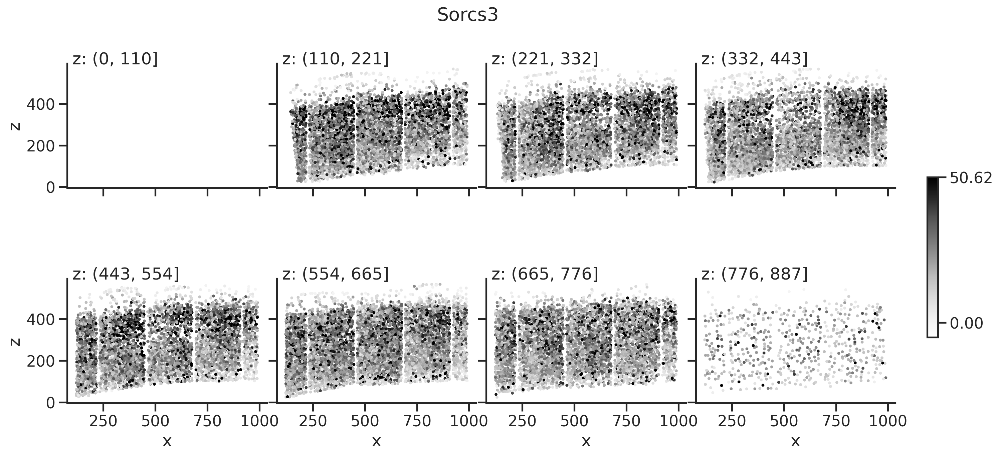

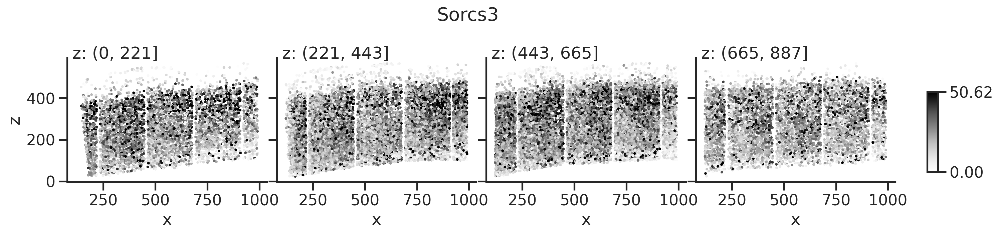

In [25]:
col = ftrs_order[0]
title = gene_names[col]

sp_x, sp_y, groupby = 'x', 'z', 'bins_yb'
view_z_sections(dfnew, sp_x, sp_y, groupby=groupby, col=col, cmap='Greys', title=title)

sp_x, sp_y, groupby = 'x', 'z', 'bins_yb_4p'
view_z_sections_4panels(dfnew, sp_x, sp_y, groupby=groupby, col=col, cmap='Greys', title=title)

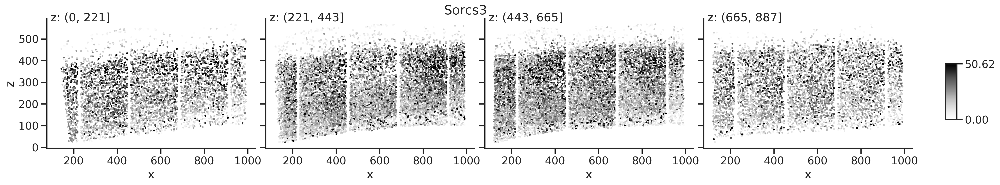

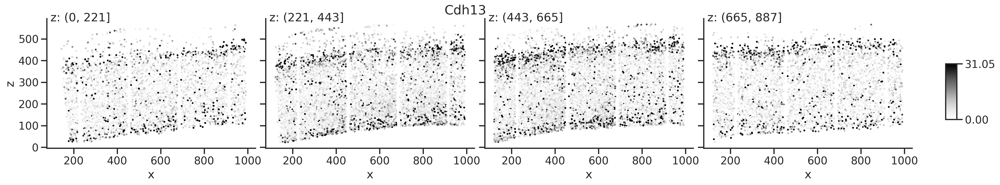

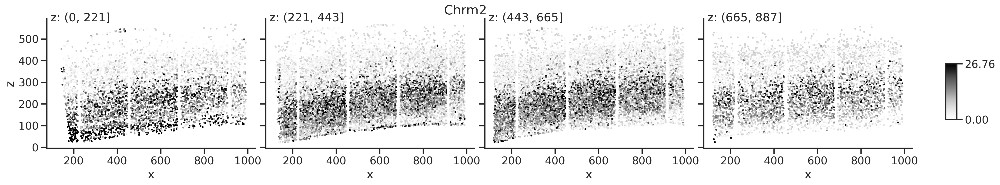

In [26]:
for col in ftrs_order:
    # col = ftrs_order[0]
    title = gene_names[col]

    # sp_x, sp_y, groupby = 'x', 'z', 'bins_yb'
    # view_z_sections(dfnew, sp_x, sp_y, groupby=groupby, col=col, cmap='Greys', title=title)

    sp_x, sp_y, groupby = 'x', 'z', 'bins_yb_4p'
    view_z_sections_4panels(dfnew, sp_x, sp_y, groupby=groupby, col=col, cmap='Greys', title=title, figsize=(4*6,1*4))

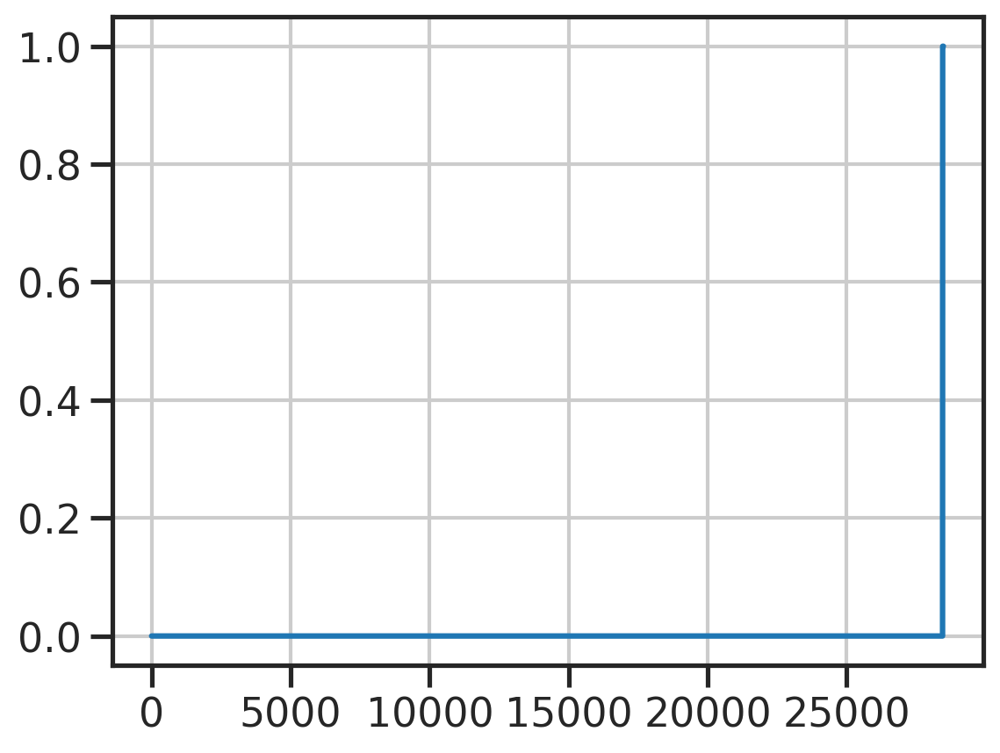

In [27]:
plt.plot(np.sort(dfnew['gcamp_binary']))

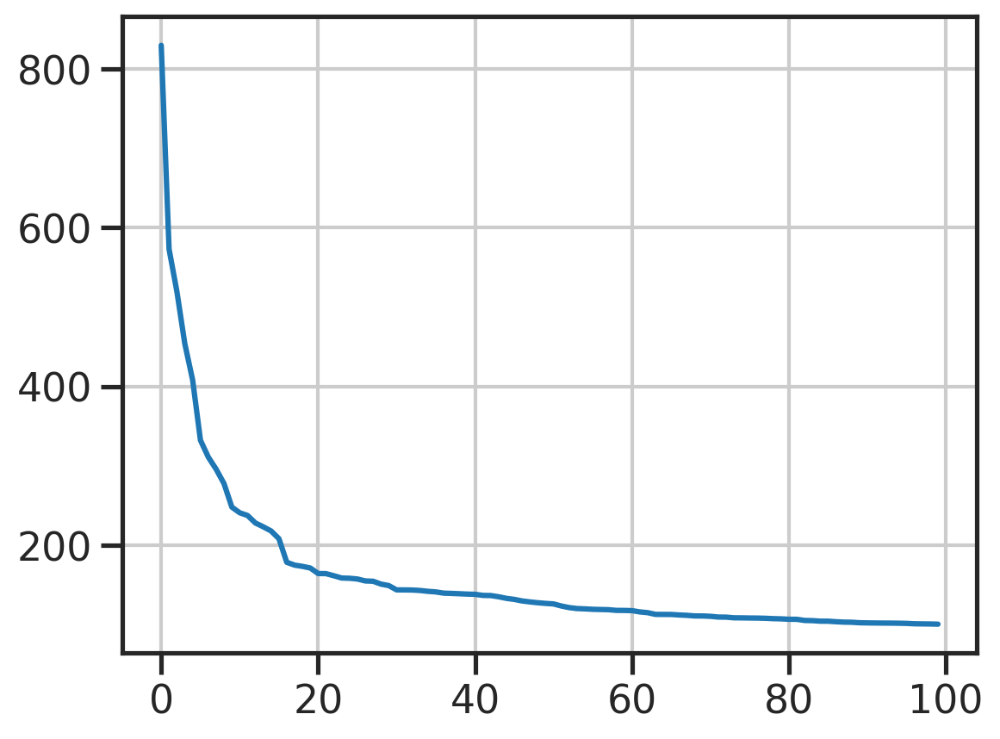

In [28]:
a = dfnew['gcamp']
a = a[a>100]
plt.plot(np.sort(a)[::-1])

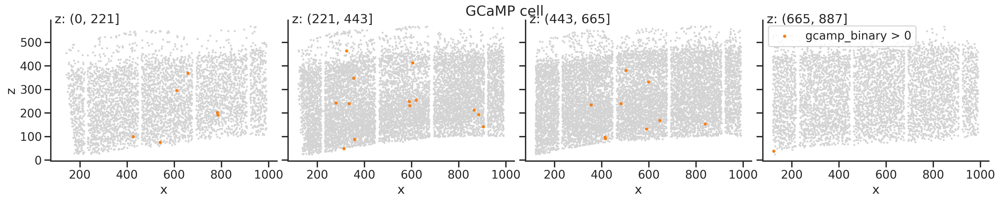

In [29]:
sp_x, sp_y, groupby = 'x', 'z', 'bins_yb_4p'
col = 'gcamp_binary'
title = 'GCaMP cell'
view_z_sections_4panels_binary(dfnew, sp_x, sp_y, groupby=groupby, col=col, cmap='Greys', title=title, figsize=(4*6,1*4), vmaxp=100)

In [30]:
dfnew[dfnew['gcamp_binary']>0].sort_values('z', ascending=False)[['r1_c2', 'r1_c0', 'r1_c4', 'z', 'x', 'y', 'gcamp']] #[[]]

,r1_c2,r1_c0,r1_c4,z,x,y,gcamp
12838,13.060383,24.669612,2.902307,462.998503,324.915140,314.409887,247.760677
27629,1.960212,22.542440,3.920424,412.264140,605.268183,439.337825,295.502321
35025,0.000000,41.726597,4.392273,380.227237,503.560223,602.919198,163.879272
33595,1.759524,42.228571,5.278571,368.404111,658.536548,199.625214,150.726786
33177,6.199664,48.357383,14.879195,347.369242,355.202198,377.245923,158.375839
16904,73.944545,53.453888,6.236287,331.495402,599.039783,623.230681,154.309222
35437,0.000000,33.125906,5.845748,294.924477,611.121371,171.670666,222.938695
33389,1.928245,26.995434,0.000000,253.707179,620.152616,396.230137,174.632094
34414,1.863808,14.910467,7.455233,248.136575,590.698008,349.140580,158.053594
12554,21.679034,21.679034,8.926661,242.055286,279.580380,343.483270,161.225410


In [31]:
df[df['gcamp_binary']>0].sort_values('z', ascending=False)[['r1_c2', 'r1_c0', 'r1_c4', 'z', 'x', 'y', 'gcamp']] #[[]]

,r1_c2,r1_c0,r1_c4,z,x,y,gcamp
12838,18.0,34.0,4.0,462.998503,324.915140,314.409887,247.760677
27629,2.0,23.0,4.0,412.264140,605.268183,439.337825,295.502321
35025,0.0,38.0,4.0,380.227237,503.560223,602.919198,163.879272
33595,1.0,24.0,3.0,368.404111,658.536548,199.625214,150.726786
33177,5.0,39.0,12.0,347.369242,355.202198,377.245923,158.375839
16904,83.0,60.0,7.0,331.495402,599.039783,623.230681,154.309222
35437,0.0,17.0,3.0,294.924477,611.121371,171.670666,222.938695
33389,1.0,14.0,0.0,253.707179,620.152616,396.230137,174.632094
34414,1.0,8.0,4.0,248.136575,590.698008,349.140580,158.053594
12554,34.0,34.0,14.0,242.055286,279.580380,343.483270,161.225410


# hierarchical clustering

In [32]:
def gen_discrete_colors(N):
    """
    """
    fig, ax = plt.subplots(figsize=(6, 1))
    fig.subplots_adjust(bottom=0.5)
    cmap = matplotlib.cm.jet
    norm = matplotlib.colors.BoundaryNorm(1+np.arange(N), cmap.N, extend='max')
    dismap = matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap)
    fig.colorbar(dismap,
                 cax=ax, orientation='horizontal')
    plt.show()
    
    palette = {i: dismap.to_rgba(i)[:3] for i in 1+np.arange(N)}
    plt.figure(figsize=(5,1))
    plt.scatter(1+np.arange(N), [0]*N, c=[palette[p] for p in palette.keys()])
    plt.show()
    return palette, dismap

(28476,) (1,)
(28476,) (2,)
(28476,) (5,)


ValueError: You must provide at least 2 boundaries (1 region) but you passed in array([1])

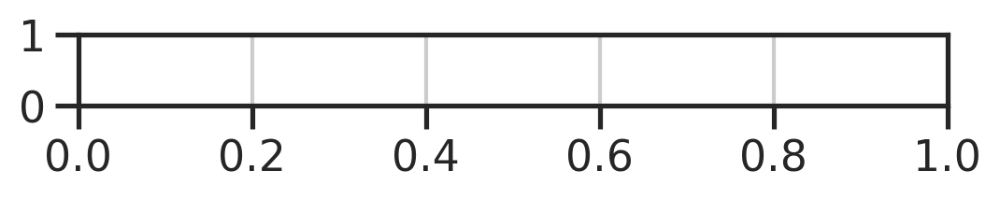

In [33]:
# sch
col_link = sch.linkage(mat_ftrs.T, method='ward', metric='euclidean')
col_order = sch.dendrogram(col_link, no_plot=True)['leaves']

row_link = sch.linkage(mat_ftrs, method='ward', metric='euclidean')
row_order = sch.dendrogram(row_link, p=30, truncate_mode='none', no_plot=True)['leaves']

# get clusters
# clsts1 = sch.fcluster(row_link, 100, criterion='distance')
# clsts2 = sch.fcluster(row_link,  50, criterion='distance')
# clsts3 = sch.fcluster(row_link,  30, criterion='distance')
clsts1 = sch.fcluster(row_link, 200, criterion='distance')
clsts2 = sch.fcluster(row_link, 150, criterion='distance')
clsts3 = sch.fcluster(row_link, 100, criterion='distance')

print(clsts1.shape, np.unique(clsts1).shape)
print(clsts2.shape, np.unique(clsts2).shape)
print(clsts3.shape, np.unique(clsts3).shape)

dfnew['clst_l1'] = clsts1
dfnew['clst_l2'] = clsts2
dfnew['clst_l3'] = clsts3

# colors
palette1, dismap1 = gen_discrete_colors(len(np.unique(clsts1)))
palette2, dismap2 = gen_discrete_colors(len(np.unique(clsts2)))
palette3, dismap3 = gen_discrete_colors(len(np.unique(clsts3)))

In [ ]:
sp_x, sp_y = 'x', 'z'
fig, axs = plt.subplots(1,3,figsize=(4*3,5*1), sharey=True, sharex=True)
# cbar_ax = fig.add_axes([0.92, 0.5, 0.01, 0.2])
for i, (col, palette, dismap, ax) in enumerate(zip(['clst_l1', 'clst_l2', 'clst_l3'], 
                                                   [ palette1,  palette2,  palette3],
                                                   [ dismap1,   dismap2,   dismap3],
                                                   axs.flat)):
    x = dfnew[sp_x].values
    y = dfnew[sp_y].values
    c = dfnew[col].values
    
    ax.grid(False)
    g = ax.scatter(x, y, c=pd.Series(palette)[c], s=5, edgecolor='none',)
    sns.despine(ax=ax)
    ax.set_title(col)
    ax.set_xlabel(sp_x)
    ax.set_ylabel(sp_y)
    ax.set_aspect('equal')
    ax.axis('off')
    fig.colorbar(dismap, ax=ax, orientation='horizontal', shrink=0.5, aspect=10)
    
fig.subplots_adjust(hspace=0.1, wspace=0.02)

In [ ]:
genes_order_v2 = np.hstack([
    mat_ftrs.columns[col_order],
    # mat_cre.columns,
    # ['RL'],
])
ftrs_order_v2 = channel_names.loc[genes_order_v2].values
ftrs_order_v2

In [ ]:
fig = plt.figure(figsize=(10,15))
axd = fig.subplot_mosaic("A"*3+"BEF")
ax = axd["A"]
sns.heatmap(
    mat_ftrs.iloc[row_order,col_order],
    yticklabels=False,
    cmap='coolwarm',
    cbar_kws=dict(shrink=0.5, location='bottom', label='zscore log2(1+normed counts)'),
    vmax=3, vmin=-3,
    ax=ax,
)
ax.set_ylabel('Cells')

for i, (ax, col) in enumerate(zip(
    (axd["B"],),# axd["C"], axd["D"]),
    ('clst_l1',),# 'clst_l2', 'clst_l3'),
    )):
    vec = dfnew[col].values
    sns.heatmap(
        dfnew[[col]].rename(columns={col: col.replace('clst_l', 'L')}).iloc[row_order],
        yticklabels=False,
        cmap='jet',
        cbar_kws=dict(location='bottom', aspect=5, label=''),
        ax=ax,
    )
    ax.set_ylabel('')
    positions = np.cumsum(np.unique(vec, return_counts=True)[1])
    ax.hlines(positions, xmin=-0.2, xmax=1, linewidth=1, linestyle='-', color='k', clip_on=False)
    for i, pos in enumerate(positions):
        ax.text(0, pos, i+1, color='white')

# ax = axd["E"]
# sns.heatmap(
#     mat_cre.iloc[row_order],
#     yticklabels=False,
#     cmap='Greys',
#     cbar_kws=dict(location='bottom', aspect=5, label='log2(1+normed counts)'),
#     ax=ax,
# )
# ax.set_ylabel('')

ax = axd["F"]
sns.heatmap(
    dfnew[['z']].iloc[row_order], 
    yticklabels=False,
    cmap='Greys',
    cbar_kws=dict(location='bottom', aspect=5, label='um'),
    # vmin=0,
    ax=ax,
)
ax.set_ylabel('')
fig.tight_layout()

In [ ]:
sp_x, sp_y = 'x', 'z'
col = 'clst_l1'
palette = palette1
dismap = dismap1
n = len(dfnew[col].unique())
nx = min(3,n)
ny = int((n+nx-1)/nx)
suptitle = 'L1'

fig, axs = plt.subplots(ny,nx,figsize=(3*nx,3*ny), sharey=True, sharex=True)
for i, ax in enumerate(axs.flat):
    x = dfnew[sp_x].values
    y = dfnew[sp_y].values
    c = dfnew[col].values
    
    ax.grid(False)
    g = ax.scatter(x, y, c=[palette[_c] if i+1==_c else 'lightgray' for _c in c], s=5, edgecolor='none',)
    
    sns.despine(ax=ax)
    ax.set_title(f"C{i+1}")
    ax.set_xlabel(sp_x)
    ax.set_ylabel(sp_y)
    ax.set_aspect('equal')
    ax.axis('off')
    
fig.suptitle(suptitle)
fig.subplots_adjust(hspace=0.1, wspace=0.02)

In [ ]:
sp_x, sp_y = 'x', 'z'
col = 'clst_l2'
palette = palette2
dismap = dismap2
n = len(dfnew[col].unique())
nx = min(4,n)
ny = int((n+nx-1)/nx)
suptitle = 'L2'

fig, axs = plt.subplots(ny,nx,figsize=(3*nx,3*ny), sharey=True, sharex=True)
for i, ax in enumerate(axs.flat):
    x = dfnew[sp_x].values
    y = dfnew[sp_y].values
    c = dfnew[col].values
    
    ax.grid(False)
    g = ax.scatter(x, y, c=[palette[_c] if i+1==_c else 'lightgray' for _c in c], s=5, edgecolor='none',)
    
    sns.despine(ax=ax)
    ax.set_title(f"C{i+1}")
    ax.set_xlabel(sp_x)
    ax.set_ylabel(sp_y)
    ax.set_aspect('equal')
    ax.axis('off')
    
fig.suptitle(suptitle)
fig.subplots_adjust(hspace=0.1, wspace=0.02)

In [ ]:
ftrs_order_v2

In [ ]:
sp_x, sp_y = 'x', 'z'
fig, axs = plt.subplots(4,4,figsize=(6*4,4*4), sharey=True, sharex=True)
cbar_ax = fig.add_axes([0.92, 0.5, 0.01, 0.2])
for i, (col, ax) in enumerate(zip(ftrs_order[::-1], axs.flat)):
    x = dfnew[sp_x].values
    y = dfnew[sp_y].values
    c = dfnew[col].values
    vmax=np.percentile(c, 95)+1e-7
    
    ax.axis('off')
    ax.grid(False)
    g = ax.scatter(x, y, c=c/vmax, s=5, edgecolor='none', cmap='Greys', vmax=1, vmin=-0.1) #vmax, vmin=-0.1*vmax)
    sns.despine(ax=ax)
    ax.set_title(gene_names[col.replace('_log2', '')])
    ax.set_xlabel(sp_x)
    ax.set_ylabel(sp_y)
    ax.set_aspect('equal')

for ax in axs.flat[i:]:
    ax.axis('off')
    
fig.colorbar(g, cax=cbar_ax, label='Normed counts\n(0-95 perctl.)', aspect=5, shrink=0.3, ticks=[0, 1])
fig.subplots_adjust(hspace=0.1, wspace=0.02)

# co-expression, clustering, cluster enrichment of expression

In [ ]:
sp_x, sp_y, groupby = 'x', 'z', 'bins_yb'
col = 'clst_l1'
view_z_sections_labels(dfnew, sp_x, sp_y, col, groupby=groupby, palette=palette1, title=None)

In [ ]:
group = 'clst_l1'
palette = palette2
data = dfnew

fig, axs = plt.subplots(6,1,figsize=(8*1,4*6), sharex=True)
grouporder = np.unique(data[group])
for i, col in enumerate(ftrs_order_v2):
    ax = axs.flat[i]
    # col = ftrs_order[0]

    sns.boxplot(data=data, x=group, order=grouporder, palette=palette, y=col, ax=ax,)
    sns.despine(ax=ax)
    ax.set_ylim(ymin=0.5)
    ax.set_title(gene_names[col])
    ax.set_ylabel("") #gene_names[col])
    ax.set_xlabel("") #gene_names[col])
    ax.set_yscale('log')
fig.subplots_adjust(wspace=0.3)

In [ ]:
group = 'clst_l1'
dfmean = dfnew.groupby(group)[ftrs_order_v2].mean()
dfmean = basicu.zscore(dfmean, axis=0)

fig, ax = plt.subplots(figsize=(6,4))
sns.heatmap(dfmean.T, ax=ax, 
            yticklabels=[gene_names[col] for col in dfmean.columns],
            cmap='coolwarm', cbar_kws=dict(label='zscore mean exp.', shrink=0.5, aspect=10))